<a href="https://colab.research.google.com/github/johanhoffman/DD2363_VT23/blob/juliusha/Lab5/report_lab_5_juilus.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Lab 5: Differential Equations**
**Julius Häger**

# **Abstract**

In this lab report I implement 2 weighted sum integration methods, one over a unit interval and one over a reference triangle, as well as 2 monte carlo integration methods, over the same unit interval and reference triangle.

#**About the code**

In [1]:
"""This program is lab report in the course"""
"""DD2363 Methods in Scientific Computing, """
"""KTH Royal Institute of Technology, Stockholm, Sweden."""

# Copyright (C) 2023 Julius Häger (juliusha@kth.se)

# This file is part of the course DD2365 Advanced Computation in Fluid Mechanics
# KTH Royal Institute of Technology, Stockholm, Sweden
#
# This is free software: you can redistribute it and/or modify
# it under the terms of the GNU Lesser General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.

'KTH Royal Institute of Technology, Stockholm, Sweden.'

# **Set up environment**

In [2]:
# Load neccessary modules.
from google.colab import files

import time
import numpy as np

from IPython.display import display, Math

from typing import Callable, Tuple

import pandas as pd
import plotly.graph_objs as go

# To we can output png/svg graphs for github
#!pip install -U kaleido

#try:
#    from dolfin import *; from mshr import *
#except ImportError as e:
#    !apt-get install -y -qq software-properties-common 
#    !add-apt-repository -y ppa:fenics-packages/fenics
#    !apt-get update -qq
#    !apt install -y --no-install-recommends fenics
#    from dolfin import *; from mshr import *
    
#import dolfin.common.plotting as fenicsplot

from matplotlib import pyplot as plt
from matplotlib import tri
from matplotlib import axes
from mpl_toolkits.mplot3d import Axes3D

import plotly.io as pio
print(pio.renderers)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# **Introduction**

TODO

# **Method**

## Assignment 1: Time stepping for scalar initial value problem $\frac{du}{dt} = f(u, t)$



TODO

In [15]:
# Assignment 1: 2-point Gauss quadrature over a unit interval

def EulerForward(T, f, u0):
  step = 0.1
  times = np.arange(0, T, step)
  values = np.zeros(len(times))
  for i, t in enumerate(times):
    #print(u0, t)
    u = u0 + step * f(u0, t)
    u0 = u
    values[i] = u;
  return values, times

f = lambda u, t : np.sin(t)*u

u = lambda t : np.exp(1 - np.cos(t))

values, times = EulerForward(30, f, 1)

exact_values = u(times)

fig = go.Figure()
fig.add_scatter(x=times, y=values, mode='lines', name="forward euler")
fig.add_scatter(x=times, y=exact_values, mode='lines', name="$u(t)$")
fig.update_layout(title="Forward euler vs. exact solution", xaxis_title="t", yaxis_title="$u(t)$", width=700, height=500)
fig.show(renderer="colab+png")

## Assignment 2: Time stepping for a system of initial value problems $\frac{du}{dt}=f(u, t)$

TODO

[ 0.  6. 12. 18. 24. 30.]


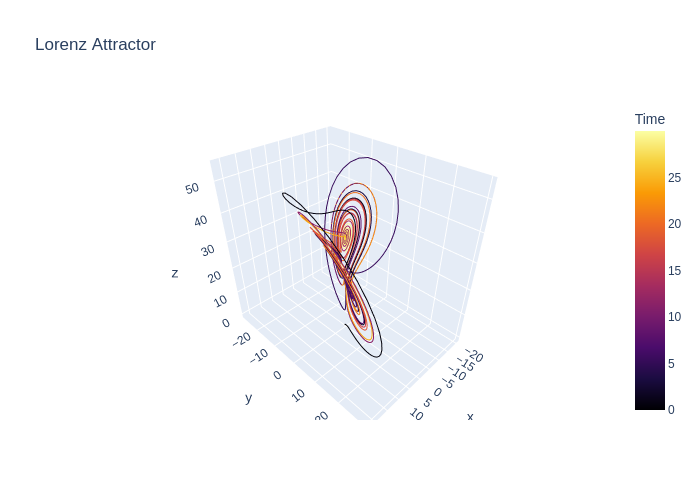

In [14]:
# Assignment 2: Time stepping for a system of initial value problems du/dt = f(u, t)

def EulerForwardSystem(T, f, u0):
  step = 0.01
  times = np.arange(0, T, step)
  # Matrix of result values
  values = np.zeros((len(times), len(u0)))
  for i, t in enumerate(times):
    u = u0 + step * f(u0[0], u0[1], u0[2], t)
    u0 = u
    values[i] = u;
  return values, times

ρ = 28
σ = 10
β = 8 / 3

# lorenz is the derivatives
lorenz = lambda x, y, z, t : np.array([ σ*(y - x), x*(ρ - z) - y, x*y - β*z ])

T = 30
values, times = EulerForwardSystem(T, lorenz, np.array([1, 0, 0]))

print(np.linspace(0, T, 6, endpoint=True))
fig = go.Figure(go.Scatter3d(x=values.T[0], y=values.T[1], z=values.T[2], mode='lines', line={ "color":times, "colorscale": "Inferno", "colorbar": {"title": "Time"}}))

fig.update_layout(title="Lorenz Attractor", width=700, height=500)

fig.show(renderer="colab+png");


## Extra Assignment: N-body problem

Renderers configuration
-----------------------
    Default renderer: 'colab'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']



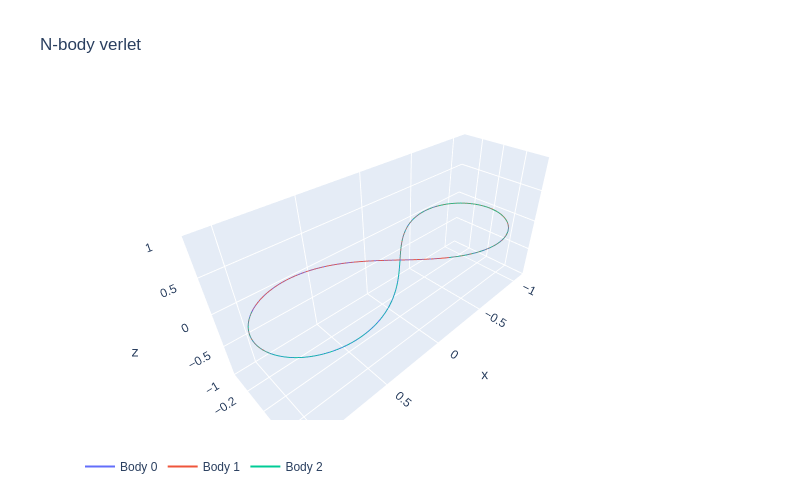

In [12]:

from scipy.spatial.distance import pdist
from sklearn.preprocessing import normalize

def pairwise_diff(positions : np.ndarray):
  n = positions.shape[0]
  i, j = np.triu_indices(n, k=1)
  a = positions[i]
  b = positions[j]
  diff = a - b
  return diff

def pairwise_mult(positions : np.ndarray):
  n = positions.shape[0]
  i, j = np.triu_indices(n, k=1)
  a = positions[i]
  b = positions[j]
  diff = a * b
  return diff

def calculate_forces(positions, mass):
  diffs = pairwise_diff(positions)
  distSqr = np.sum(diffs**2, axis=1, keepdims=True)
  # diffs contains dirs from this point on...
  dirs = normalize(diffs, axis=1)

  massMult = pairwise_mult(mass)

  Fij = G * massMult * dirs / distSqr

  iToIndex, jToIndex = np.triu_indices(len(mass), k=1)

  # FIXME: We want to avoid creating the full array here...
  FijMatrix = np.zeros((len(mass), len(mass), 3))
  FijMatrix[iToIndex, jToIndex, :] = Fij
  FijMatrix = -FijMatrix + np.transpose(FijMatrix, (1, 0, 2))

  Fi = np.sum(FijMatrix, axis = 1)
  F = Fi / mass

  return F

def update_verlet(positions, velocities, F, mass, step, G):

  vt12Δt = velocities + 0.5*F*step
  new_positions = positions + vt12Δt * step
  FtΔt = calculate_forces(new_positions, mass)
  velocities = vt12Δt + 0.5 * FtΔt * step

  return new_positions, velocities, FtΔt

def run_simulation_verlet(T, step, initial_positions, initial_velocities, mass, G):
  Tn = len(np.arange(0, T, step_size))
  times = np.arange(0, T, step_size)

  N = len(initial_positions)

  positions = np.zeros((Tn+1, N, 3)) 
  positions[0] = initial_positions
  velocities = np.zeros((Tn+1, N, 3))
  velocities[0] = initial_velocities

  F = calculate_forces(positions[0], mass)

  for i in range(Tn):
    positions[i+1], velocities[i+1], F = update_verlet(positions[i], velocities[i], F, mass, step_size, G)

  return positions, times

G = 4.3003 # pc * (km/s)^2 * M_o^-1
G = 1

def create_figure(N, positions, times, title, labels, width, height):
  fig = go.Figure()
  for i in range(N):
    #fig.add_scatter3d(x=positions[:,i,0], y=positions[:,i,1], z=positions[:,i,2], mode='lines', name=labels[i], line={ "color":times, "colorscale": "Inferno", "colorbar": {"title": "Time"}})
    fig.add_scatter3d(x=positions[:,i,0], y=positions[:,i,1], z=positions[:,i,2], mode='lines', name=labels[i], text=[f"t={t}" for t in times])
  fig.update_layout(title=title, width=width, height=height)
  return fig

T = 5
step_size = 0.001

N = 3

# For values see: https://en.wikipedia.org/wiki/Three-body_problem#cite_note-11
mass = np.ones((N, 1))
positions = np.zeros((N, 3))
positions[0] = np.array([-0.97000436, 0.24308753, 0])
positions[1] = np.array([0, 0, 0])
positions[2] = -positions[0, :]
velocities = np.zeros((N, 3))
velocities[0] = np.array([0.4662036850, 0.4323657300, 0])
velocities[1] = np.array([-0.93240737, -0.86473146, 0])
velocities[2] = velocities[0, :]

trajectories_verlet, times_verlet = run_simulation_verlet(T, step_size, positions, velocities, mass, G)

fig = create_figure(N, trajectories_verlet, times_verlet, "N-body verlet", [f"Body {i}" for i in range(N)], 800, 500)

#fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=0,ticks="outside"))
fig.update_layout(legend_orientation="h")

fig.show(renderer="colab+png");

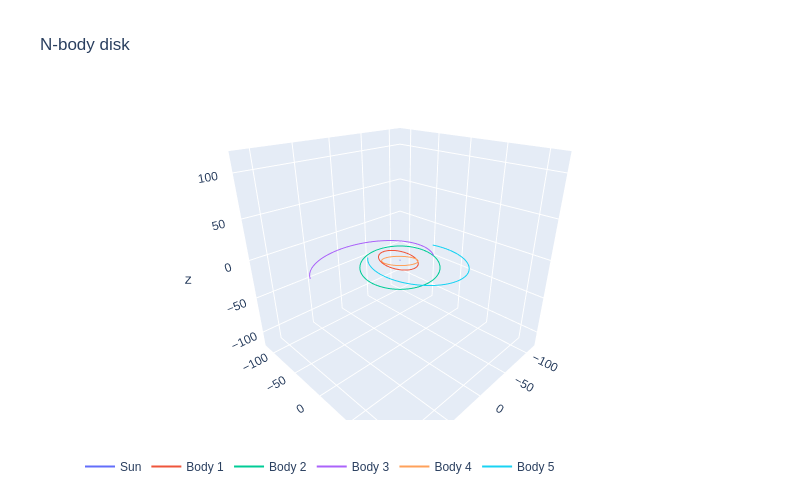

In [13]:
N = 6

r = np.random.rand(N) * 20 + 20
θ = np.random.rand(N) * np.pi * 2
z = np.random.rand(N) * 5

x = r * np.cos(θ)
y = r * np.sin(θ)

x[0] = 0
y[0] = 0
z[0] = 0

positions = np.array([x, y, z]).T

v_x = -np.sin(θ) * 0.4
v_y = np.cos(θ) * 0.4
v_z = np.zeros(N)

v_x[0] = 0
v_y[0] = 0
v_z[0] = 0

velocities = np.array([v_x, v_y, v_z]).T

# rought estimate of the mass of earth
mass = np.ones((N, 1)) * 10/333000 + 1/333000 

mass[0] = 1

T = 1000
step_size = 0.05

G = 1
G = 4.3003 # pc * (km/s)^2 * M_o^-1

import builtins

trajectories, times = run_simulation_verlet(T, step_size, positions, velocities, mass, G)

max = trajectories.max()
min = trajectories.min()

diff = np.abs(max - min)
max += diff * 0.2
min -= diff * 0.2

fig.update_layout(scene_aspectmode='cube')

fig = create_figure(N, trajectories, times, "N-body disk", ["Sun"]+[f"Body {i}" for i in range(1,N)], 800, 500)

scene=dict(camera=dict(eye=dict(x=1.15, y=1.15, z=0.8)), #the default values are 1.25, 1.25, 1.25
           xaxis=dict(range=[min, max]),
           yaxis=dict(range=[min, max]),
           zaxis=dict(range=[min, max]),
           aspectmode="cube",
           )

fig.update_layout(scene = scene)

fig.update_layout(legend_orientation="h")

fig.show(renderer="colab+png")

# **Results**

## Assignment 1: Time stepping for scalar initial value problem $du/dt = f(u, t)$

TODO

In [7]:
# TODO

## Assignment 2: Time stepping for a system of initial value problems $du/dt = f(u, t)$

TODO

In [8]:
# TODO

# **Discussion**

TODO